# Figures for paper

## Setup

In [7]:
%cd work/notebooks

[Errno 2] No such file or directory: 'work/notebooks'
/home/jovyan/work/notebooks


In [8]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
# Import local code
import sys
sys.path.append('../code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from mri_maps import *
from enrichments import *
from disorders import *
from brainspan import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");

### Set gradient version

In [11]:
pca = gradientVersion(approach='pca', kernel=None).fit('hcp_base')
pca_hcp_3d_ds8 = gradientVersion(approach='pca', kernel=None).fit('hcp_3donors_ds8')
dm_hcp_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds8')
dm_hcp_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')

New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=hcp_base
New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=hcp_3donors_ds8
New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_ds8
New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


Output scores and weights

In [115]:
dm_hcp_ds8.clean_scores().to_csv('../outputs/ahba_dme_hcp_top3kgenes_scores.csv')
dm_hcp_ds8.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top3kgenes_weights.csv')

dm_hcp_3d_ds5.clean_scores().to_csv('../outputs/ahba_dme_hcp_top8kgenes_scores.csv')
dm_hcp_3d_ds5.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top8kgenes_weights.csv')

---

# Fig 1

### Gradients on brains

In [12]:
versions_scores = (pd.concat({
    'PCA, all regions and genes': pca.clean_scores(),
    'PCA, only 3+ donor regions,\ntop 20% genes': pca_hcp_3d_ds8.clean_scores(),
    'DME, only 3+ donor regions,\ntop 50% genes': dm_hcp_3d_ds5.clean_scores(),
    'DME, all regions,\ntop 20% genes': dm_hcp_ds8.clean_scores()
})
        .reset_index(level=0).rename({'level_0':'version'},axis=1)
         )

In [13]:
versions_scatter = (versions_scores.set_index(['version', 'label']).stack().unstack(0)
               .iloc[:,[0,1]].reset_index(1).set_axis(['G','x','y'],axis=1)
              )

### Triplets with filtering

In [7]:
# triplets_hcp = get_triplets(atlas=fetch_hcp())
# save_pickle(triplets_hcp, "triplets_hcp")
triplets_hcp = load_pickle('triplets_hcp')
print("Got base triplets")
# triplets_hcp_3donors = get_triplets(atlas=fetch_hcp(), donors_threshold=3)
# save_pickle(triplets_hcp_3donors, "triplets_hcp_3donors")
triplets_hcp_3donors = load_pickle('triplets_hcp_3donors')
print("Got 3donors triplets")

Got base triplets
Got 3donors triplets


In [122]:
triplets_hcp_2donors = get_triplets(atlas=fetch_hcp(), donors_threshold=2)
save_pickle(triplets_hcp_2donors, "triplets_hcp_2donors")
# triplets_hcp_2donors = load_pickle('triplets_hcp_2donors')
print("Got 2donors triplets")

Done triplet 012
Done triplet 013
Done triplet 014
Done triplet 015
Done triplet 023
Done triplet 024
Done triplet 025
Done triplet 034
Done triplet 035
Done triplet 045
Done triplet 123
Done triplet 124
Done triplet 125
Done triplet 134
Done triplet 135
Done triplet 145
Done triplet 234
Done triplet 235
Done triplet 245
Done triplet 345
Got 3donors triplets


Load triplets data from pickles since triplets are slow to compute

In [25]:
# triplets_pca = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='pca', kernel=None), with_coefs=False)
# triplets_dm = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)
# triplets_pca_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel=None), with_coefs=False)
# triplets_dm_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)

KeyboardInterrupt: 

In [124]:
triplets_pca_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='pca', kernel=None))
triplets_dm_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='dm', kernel='normalized_angle', alpha=1))

Computed triplet stability
Computed triplet stability


In [125]:
# triplets_dict = {
#     'PCA, all regions': triplets_pca, 
#     'PCA, only 3+ donor regions': triplets_pca_3d,
#     'DME, only 3+ donor regions': triplets_dm_3d,
#     'DME, all regions': triplets_dm
# }
# save_pickle(triplets_dict, 'triplets_dict')
triplets_dict = load_pickle('triplets_dict')

triplets_plot_v2 = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )

triplets_highlights = [0,.8,.5,.8]
df_triplets_highlight = pd.DataFrame({'method': triplets_dict.keys(), 'DS':triplets_highlights}).assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))

In [15]:
triplets_dict['PCA, all regions']

,how,version,component,pair,corr,corr_abs
0,Region scores,0.0,1,012-345,0.774335,0.774335
1,Region scores,0.0,2,012-345,0.041373,0.041373
2,Region scores,0.0,3,012-345,0.245817,0.245817
3,Region scores,0.0,4,012-345,0.106467,0.106467
4,Region scores,0.0,5,012-345,-0.107603,0.107603
...,...,...,...,...,...,...
495,Region scores,0.9,1,045-123,-0.907615,0.907615
496,Region scores,0.9,2,045-123,-0.772870,0.772870
497,Region scores,0.9,3,045-123,-0.517418,0.517418
498,Region scores,0.9,4,045-123,-0.155683,0.155683


### Check alignment with six brains

In [13]:
triplets_hcp_3donors_pca_ds_levels = get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel=None)

KeyboardInterrupt: 

In [28]:
triplet_corrs = {}
for name, triplet in triplets_hcp_3donors_pca_ds_levels[0.8].items():
    triplet_corrs[name] = pca_hcp_3d_ds8.corr_scores(triplet, match=True)['corr']
pd.concat(triplet_corrs, axis=1).mean(axis=1)

NameError: name 'triplets_hcp_3donors_pca_ds_levels' is not defined

### Variance explained

In [35]:
dm_hcp_3d_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds8')

New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds8


In [52]:
pca_hcp_3d_ds8.var / pca_hcp_3d_ds8.expression.var().sum()

array([0.51285959, 0.11362159, 0.06620111, 0.03990287, 0.02690718])

In [53]:
dm_hcp_3d_ds8.scores.var().values / dm_hcp_3d_ds8.affinity.var()

array([0.68028121, 0.06203807, 0.03835231, 0.01129727, 0.00665823])

In [54]:
df_var = pd.DataFrame({
    'PCA all': pca.var / pca.expression.var().sum(),
    'PCA 3+ DS8': pca_hcp_3d_ds8.var / pca_hcp_3d_ds8.expression.var().sum(),
    'DM 3+ DS8': dm_hcp_3d_ds8.scores.var().values / dm_hcp_3d_ds8.affinity.var(),
    'DM 3+ DS5': dm_hcp_3d_ds5.scores.var().values / dm_hcp_3d_ds5.affinity.var()    
}, index=[i+1 for i in range(5)]).melt(ignore_index=False).reset_index().set_axis(['PC','which','var'],axis=1)

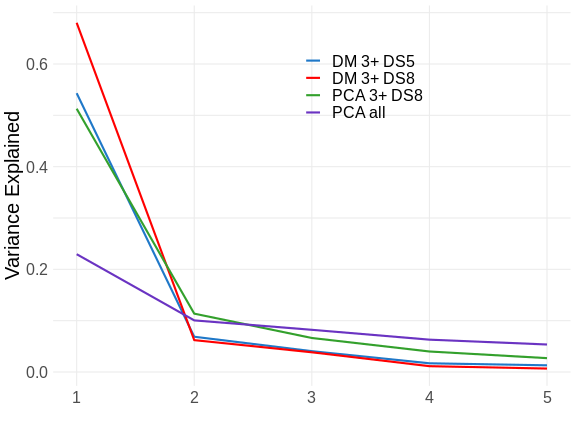

In [55]:
%%R -i df_var -w 8 -h 6 --units in
source("../code/Rplots.R")
plot_var_exp(df_var) + 
theme(text=element_text(size=20), panel.grid.minor.y=element_line())

In [56]:
df_var.set_index(['PC','which']).unstack(1)

var                               
which DM 3+ DS5 DM 3+ DS8 PCA 3+ DS8   PCA all
PC                                            
1      0.543100  0.680281   0.512860  0.229431
2      0.068633  0.062038   0.113622  0.100492
3      0.040521  0.038352   0.066201  0.082149
4      0.016900  0.011297   0.039903  0.062958
5      0.012982  0.006658   0.026907  0.053519

### Medians and mins

In [16]:
print('Median inter-triplet abs correlation:')
triplets_plot_v2.groupby(['method','component','DS']).median()['corr_abs'].unstack('DS').rename_axis('DS',axis=1)

Median inter-triplet abs correlation:


DS                                         0.0       0.1       0.2       0.3  \
method                     component                                           
PCA, all regions           1          0.721299  0.748945  0.778971  0.807344   
                           2          0.118019  0.110347  0.159537  0.171453   
                           3          0.112725  0.125533  0.117388  0.069135   
                           4          0.145198  0.139684  0.202680  0.155137   
                           5          0.298828  0.336792  0.404655  0.448716   
PCA, only 3+ donor regions 1          0.943951  0.945355  0.947445  0.950455   
                           2          0.641327  0.641444  0.650353  0.673907   
                           3          0.503075  0.532790  0.530572  0.481658   
                           4          0.216319  0.195388  0.149461  0.228965   
                           5          0.181065  0.212523  0.186535  0.161470   
DME, only 3+ donor regions 1          0.940689  0.942601  0.945681  0.949023   
                           2          0.708939  0.701071  0.720477  0.727123   
                           3          0.538528  0.545562  0.579053  0.582787   
                           4          0.241565  0.278260  0.196520  0.203972   
                           5          0.286040  0.289447  0.277359  0.240177   
DME, all regions           1          0.779795  0.797478  0.820583  0.838769   
                           2          0.088497  0.130029  0.177378  0.227729   
                           3          0.140237  0.120844  0.143643  0.136673   
                           4          0.209643  0.335823  0.459604  0.335729   
                           5          0.341804  0.362637  0.307705  0.268746   

DS                                         0.4       0.5       0.6       0.7  \
method                     component                                           
PCA, all regions           1          0.833313  0.855669  0.872687  0.887131   
                           2          0.171673  0.202981  0.307654  0.370857   
                           3          0.113449  0.144438  0.212100  0.482574   
                           4          0.227536  0.274783  0.483740  0.198495   
                           5          0.463628  0.214419  0.105734  0.162206   
PCA, only 3+ donor regions 1          0.954674  0.957945  0.962631  0.966237   
                           2          0.691238  0.731108  0.783653  0.841516   
                           3          0.513034  0.511717  0.489941  0.619852   
                           4          0.228333  0.251535  0.288701  0.348012   
                           5          0.217577  0.268531  0.247937  0.131774   
DME, only 3+ donor regions 1          0.952160  0.956244  0.959857  0.965207   
                           2          0.728556  0.726947  0.735955  0.787616   
                           3          0.591061  0.649015  0.739045  0.782970   
                           4          0.307773  0.279736  0.371368  0.479106   
                           5          0.288111  0.332485  0.375019  0.259159   
DME, all regions           1          0.853084  0.867552  0.883273  0.896015   
                           2          0.302840  0.500902  0.573158  0.631447   
                           3          0.297029  0.229392  0.310658  0.471018   
                           4          0.396860  0.311541  0.199251  0.268660   
                           5          0.282312  0.176209  0.288640  0.124639   

DS                                         0.8       0.9  
method                     component                      
PCA, all regions           1          0.900200  0.913372  
                           2          0.557307  0.795161  
                           3          0.476907  0.441650  
                           4          0.259545  0.392915  
                           5          0.145571  0.266259  
PCA, only 3+ donor regions 1          0.968536  0.971698  
      

### Versions corrs

In [17]:
for G in ['G1','G2','G3']:
    print(G)
    display(versions_scores.set_index(['label','version'])[G].unstack().corr())

G1


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.998607,0.938777,0.995128
"DME, only 3+ donor regions,\ntop 50% genes",0.998607,1.000000,0.955483,0.995502
"PCA, all regions and genes",0.938777,0.955483,1.000000,0.954239
"PCA, only 3+ donor regions,\ntop 20% genes",0.995128,0.995502,0.954239,1.000000


G2


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.936557,0.621186,0.825476
"DME, only 3+ donor regions,\ntop 50% genes",0.936557,1.000000,0.592436,0.954627
"PCA, all regions and genes",0.621186,0.592436,1.000000,0.499531
"PCA, only 3+ donor regions,\ntop 20% genes",0.825476,0.954627,0.499531,1.000000


G3


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.884786,-0.058510,0.666910
"DME, only 3+ donor regions,\ntop 50% genes",0.884786,1.000000,-0.079200,0.883315
"PCA, all regions and genes",-0.058510,-0.079200,1.000000,-0.013067
"PCA, only 3+ donor regions,\ntop 20% genes",0.666910,0.883315,-0.013067,1.000000


### Cross-correlation

In [20]:
# Scores
dm_hcp_3d_ds5.clean_scores().corr()

,G1,G2,G3
G1,1.000000e+00,4.792989e-08,-2.059994e-07
G2,4.792989e-08,1.000000e+00,3.827356e-08
G3,-2.059994e-07,3.827356e-08,1.000000e+00


In [21]:
# Weights
dm_hcp_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).corr()

,G1,G2,G3
G1,1.000000,-0.038875,0.018487
G2,-0.038875,1.000000,0.104590
G3,0.018487,0.104590,1.000000


### Smoothness (Moran's I)

In [36]:
versions_scores.iloc[:,:4].groupby('version', sort=False).agg(get_moran_I).T

version,"PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","DME, all regions,\ntop 20% genes"
G1,0.497240,0.463211,0.485249,0.511465
G2,0.227112,0.661179,0.583125,0.488972
G3,-0.006063,0.218570,0.206296,0.292110


Message: With careful processing, PC2 and PC3 of the AHBA are robust and generalizable.

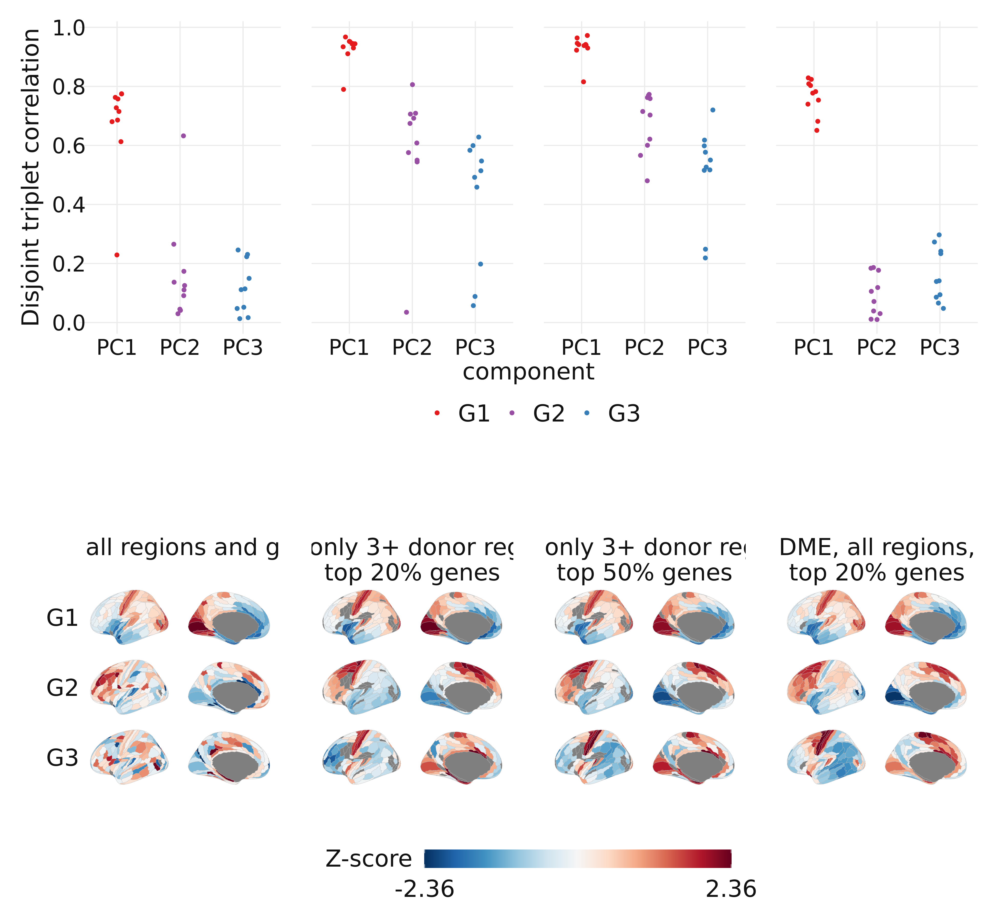

In [13]:
%%R -w 13 -h 12 --units in -r 300 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight
source("../code/Rplots.R")
source("../code/brainPlots.R")

triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes')) %>% head
g2 <- plot_triplets_simple(triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes'))) + 
    theme(axis.text.y=element_text(margin=margin(r=-40)))
# g2 <- plot_triplets_v2(triplets_plot_v2, facet='h') + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
#     theme(axis.text.y=element_text(margin=margin(r=-40)))
g3 <- plot_hcp(versions_scores,# %>% rename(PC1=G1, PC2=G2, PC3=G3),
               spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Z-score', title.vjust=1))
    
(g2 / g3) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_blank(),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

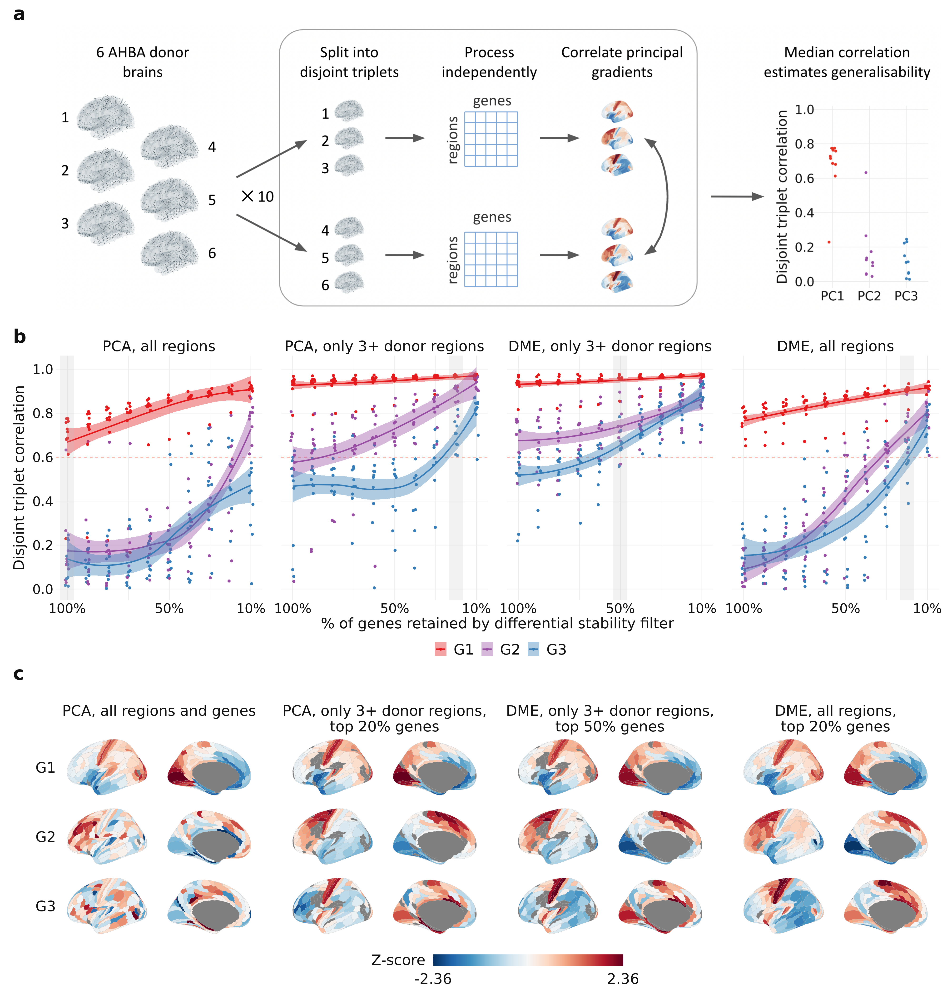

In [257]:
%%R -w 20 -h 21 --units in -r 200 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight -i versions_scatter
source("../code/Rplots.R")
source("../code/brainPlots.R")
# source("../code/brainspanPlots.R")
# library(magick)
# img <- image_read("../data/schematics/fig1_schem.png")
library(png)
img_path <- "../data/schematics/schem2.png"
img <- readPNG(img_path, native=T)

# g0 <- image_ggplot(img)
g0 <- ggplot() + inset_element(img, left=0,right=1,top=1,bottom=0, align_to='panel',ignore_tag=T)
g2 <- plot_triplets_v2(triplets_plot_v2, facet='h', smooth=T) + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
    theme(axis.text.y=element_text(margin=margin(r=-40))
          # axis.title.y=element_text(margin=margin(r=-10))
         )
# g3a <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'PCA')), spacing_x=2) + theme(legend.position='none', strip.text.y=element_text(margin=margin(l=10)))
# g3b <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'DM')), spacing_x=2) + theme(legend.position='bottom', strip.text.y=element_text(margin=margin(l=10))) + 
#         guides(fill=guide_colorbar(title='Score', barwidth=10, title.vjust=1)) + plot_layout(tag_level='new')
g3 <- plot_hcp(versions_scores, spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Z-score', title.vjust=1)) +
    theme(strip.text.y=element_text(margin=margin(l=10)))
# g4 <- plot_scatter_corrs(versions_scatter, size=8,
#                          xlab='DME scores,\n3+ donor regions,\ntop 50% genes', 
#                          ylab='DME scores, all regions, \ntop 20% genes')

layout <- c(
  area(t = 1, b = 19, l = 1, r = 48),
  area(t = 20, b = 34, l = 1, r = 48),
  area(t = 35, b = 48, l = 1, r = 48)
  # area(t = 6, b = 7, l = 6, r = 10),
#   area(t = 1, b = 17, l = 40, r = 48)
)

plot <- g0 + g2 + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated
# ggsave(filename='test2.png', device='png')

---

# Fig 2

In [15]:
weights_version = dm_hcp_3d_ds5

In [16]:
weights = weights_version.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)

In [17]:
weights_version_scores = weights_version.clean_scores()

### Gene weight vs DS

In [18]:
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
weights_ds = weights.set_axis(['G1','G2','G3'],axis=1).join(stability)

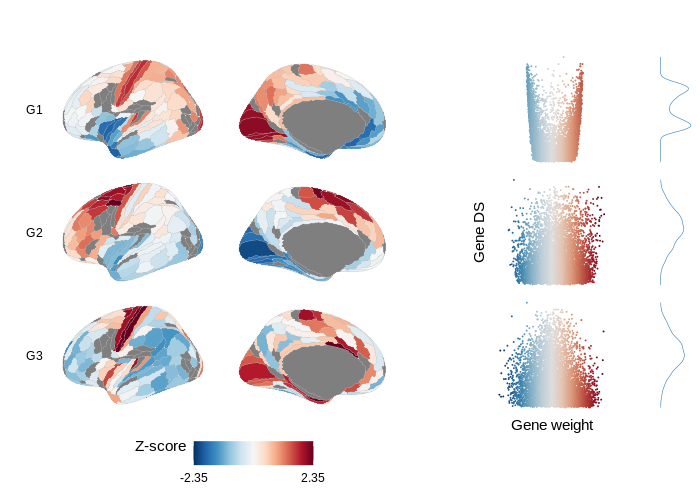

In [19]:
%%R -i weights_version_scores -i weights_ds -w 7 -h 5 --units in -r 100
source("../code/brainPlots.R")
source("../code/Rplots.R")
(plot_hcp(weights_version_scores, switch='y') | 
 plot_weights_ds(weights_ds, ncol=1) |
 plot_weights_dist(weights_ds)
) + plot_layout(widths=c(12,6,1))

### GO enrichments

In [88]:
go_enrichments = combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=False, top_n=5, filter_001=False) 
go_enrichments = go_enrichments.replace({'G':{'G2':'G2: Metabolic vs Regulatory', 'G3':'G3: Immune vs Synaptic'}})

### Layer enrichments

In [21]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=False)
layer_stats = compute_null_p(*compute_enrichments(weights, nulls, layer_genes))

### Cell enrichments

In [22]:
cell_genes = get_cell_genes(which='jakob', add_synapses=True)
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
true_scores, null_scores = compute_enrichments(weights, nulls, cell_genes, how='mean')
cell_null_p = compute_null_p(true_scores, null_scores, adjust='fdr_bh', order=order)

In [23]:
cell_rename = {
    'Neuro-Ex':'Neurons (Ex.)',
    'Neuro-In':'Neurons (In.)',
    'Astro':'Astrocytes',
    'Micro':'Microglia',
    'Endo':'Endothelial cells',
    'Oligo':'Oligodendrocytes',
    'OPC':'OPC'
}
    
cell_null_p = cell_null_p.replace({'label':cell_rename})


### Gene maps

In [24]:
# celltypes = ['Astro', 'Micro', 'Oligo']
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
cell_genes = get_cell_genes(which='jakob', add_synapses=True) #.loc[lambda x: np.isin(x['label'], celltypes)]
gene_maps = make_gene_maps(weights_version, cell_genes, order=order, normalize='std', method='mean')
gene_maps = gene_maps.rename(cell_rename, axis='columns')

In [29]:
# # single_genes = ['ALDH1L1','AIF1','MOG']
# # single_genes = pd.DataFrame({'gene':single_genes, 'label':single_genes})
# # single_gene_maps = make_gene_maps(weights_version, single_genes, normalize='std', method='mean')

# gene_maps = (pd.concat([single_gene_maps, cell_gene_maps], axis=1)
#              .apply(lambda x: (x-np.mean(x))/np.std(x))
#             )

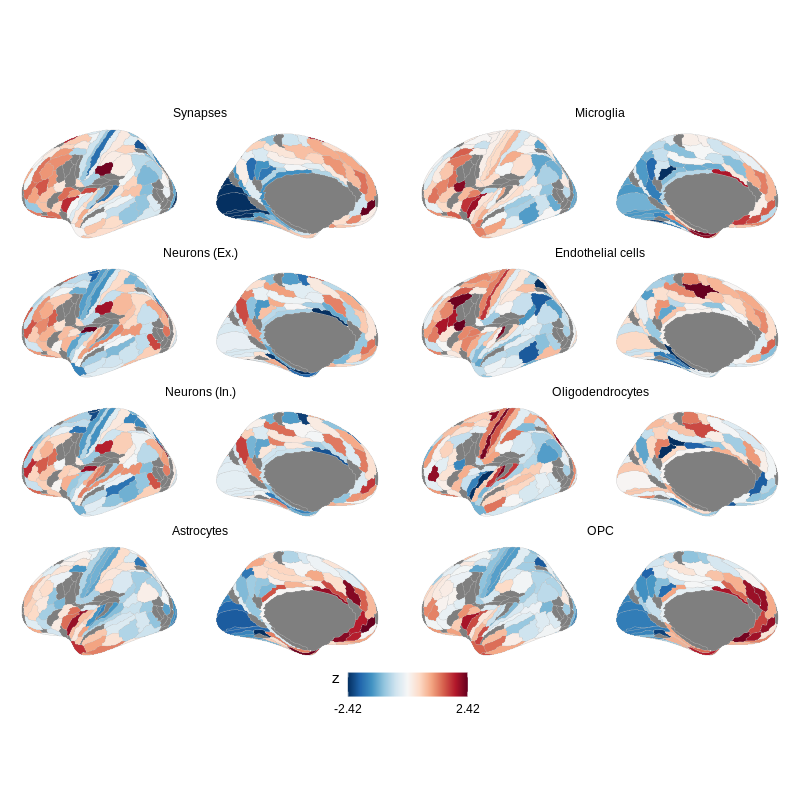

In [85]:
%%R -i gene_maps -w 8 -h 8 --units in -r 100
source("../code/plot_maps.R")
colors <- rev(brewer.rdbu(100))
# p1 <- plot_maps(single_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# p2 <- plot_maps(cell_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# p1 | p2
plot_maps(gene_maps, ncol=2, colors=colors, colorscale='absolute')

### Brainspan mapping

In [25]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()

In [26]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### Brainspan development

In [27]:
hcp_mapped_scores = get_mapped_scores(weights_version, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, weights_version)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [28]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

In [29]:
bs_scores_corr

,age,G,corr
0,Pre-Birth,G1,0.658113
1,Birth-13 yrs,G1,0.883124
2,18-40 yrs,G1,0.957974
3,Pre-Birth,G2,0.712468
4,Birth-13 yrs,G2,0.900557
5,18-40 yrs,G2,0.881590
6,Pre-Birth,G3,0.309301
7,Birth-13 yrs,G3,0.621085
8,18-40 yrs,G3,0.837594


### Brainspan adult correlation

In [30]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

In [31]:
scores_plot = make_brain_plots(weights_version, hcp_bs_mapping, bs_scores).replace({'version':{'BrainSpan':'BrainSpan 18-40yrs'}})

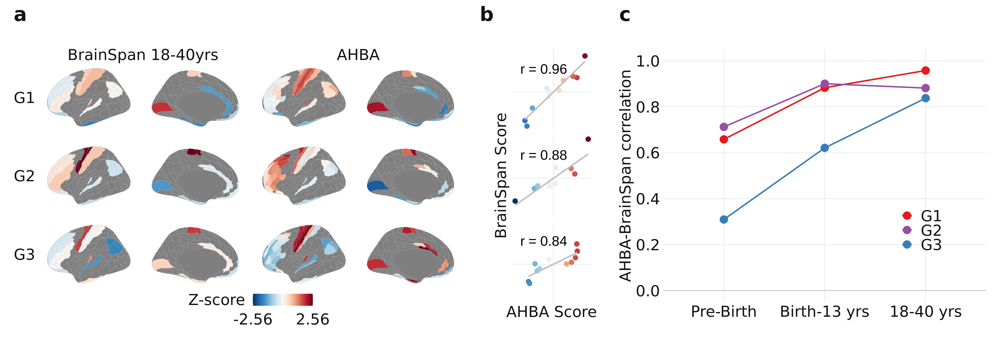

In [32]:
%%R -w 20 -h 7 --units in -r 200 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainspanPlots.R")
source("../code/brainPlots.R")

# g10 <- plot_bs_hcp_mapping(hcp_bs_mapping, xlab='BrainSpan regions\nmatched to HCP-MMP1.0') + theme(plot.margin=margin(r=-50, 'pt'), plot.tag.position=c(0,.95))
g11 <- plot_hcp(scores_plot, facet='h', switch='y') + theme(
            plot.tag.position = c(0.1, .9),
            strip.text.x=element_text(size=22), 
            strip.text.y.left=element_text(size=22, margin=margin(l=0)),
            legend.position=c(.5,-.1),
            legend.direction='horizontal',
            legend.title=element_text(vjust=1),
            panel.spacing.y = unit(1, 'lines')
            )
g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
            strip.text.y = element_blank(),
            axis.title.y = element_text(angle=90,size=22, color='grey7', family='Calibri'),
            axis.title.x=element_text(size=22, color='grey7', family='Calibri')
)
g13 <- plot_bs_scores_corr(bs_scores_corr) + 
    theme(legend.position=c(.8,.3), plot.tag.position = c(0, .95),
          axis.text=element_text(size=22, color='grey7', family='Calibri')
         )
    
layout <- c(
    # area(t=1,b=24,l=1,r=8),
    # area(t=1,b=24,l=9,r=30),
    area(t=1,b=24,l=1,r=24),
    area(t=1,b=24,l=25,r=30),
    area(t=1,b=24,l=31,r=48)
)

# plot <- g10 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g11 + g12 + g13 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

g_brainspan = themed + plot_annotation(tag_level='a')
g_brainspan

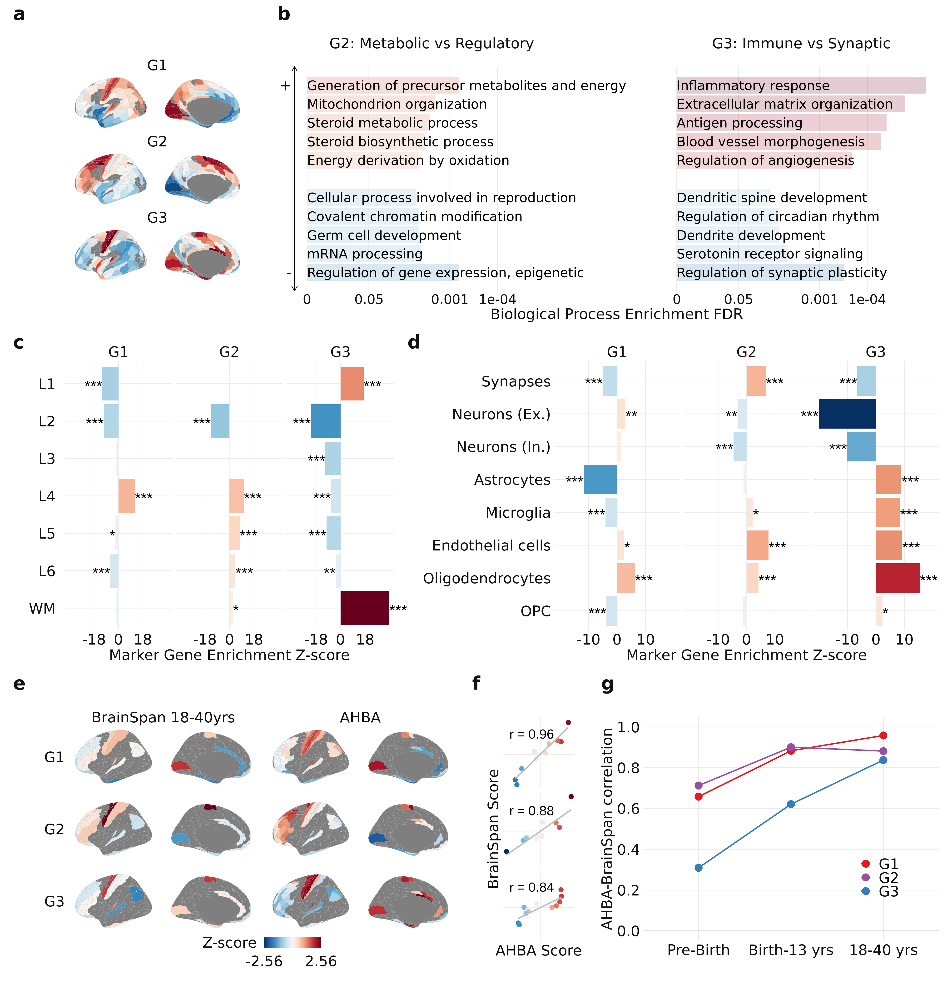

In [89]:
%%R -w 20 -h 21 --units in -r 200 -i weights_version_scores -i weights_ds -i go_enrichments -i gene_maps -i cell_null_p -i layer_stats -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainPlots.R")
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")


# g1a <- plot_hcp(hcp_scores %>% mutate(version='Region scores'), switch='both') + 
g1a <- plot_hcp(weights_version_scores, facet='w') + guides(fill='none')
# g1b <- plot_weights_ds(weights_ds,ncol=1) + plot_layout(tag_level='new')
g2 <- plot_go_enrichments(go_enrichments, size=7, name='Biological Process Enrichment FDR') + 
        theme(axis.text.y = element_text(size=22, color='grey7', family='Calibri')) 
g3 <- plot_enrichment_bars_z(layer_stats, xlab='Marker Gene Enrichment Z-score') + 
        theme(axis.text.y = element_text(margin=margin(r=-20, 'pt'), size=22, color='grey7', family='Calibri'),
              axis.text.x = element_text(size=22, color='grey7', family='Calibri'))
g4 <- plot_enrichment_bars_z(cell_null_p, xlab='Marker Gene Enrichment Z-score') + 
        theme(axis.text = element_text(size=22, color='grey7', family='Calibri'))

# g11 <- plot_hcp(scores_plot, facet='h', switch='y') + theme(
#             strip.text.x=element_text(size=20), 
#             strip.text.y.left=element_text(size=20, margin=margin(l=0)),
#             legend.position='none',
#             panel.spacing.y = unit(1, 'lines')
#             )
# g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
#             strip.text.y = element_blank(),
#             axis.title.y = element_text(angle=90)
# )
# g13 <- plot_bs_scores_corr(bs_scores_corr) + theme(legend.position=c(.8,.3))
    

layout <- c(
    area(t=1,b=15,l=1,r=13),
#     area(t=1,b=15,l=14,r=18),
    # area(t=1,b=15,l=18,r=19),    
    
    area(t=1,b=15,l=15,r=48),
    
    area(t=16,b=33,l=1,r=21),
    area(t=16,b=33,l=22,r=48),

    area(t=34,b=48,l=1,r=48)    
    # area(t=34,b=48,l=1,r=21),
    # area(t=34,b=48,l=21,r=24),
    # area(t=34,b=48,l=25,r=48)
)
    
# plot <- g1a + g1b + g2 + g3 + g4 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g1a + g2 + g3 + g4 + g_brainspan + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 3

In [34]:
maps=get_maps()
hcp_scores = dm_hcp_3d_ds5.clean_scores()
# hcp_scores = dm_hcp_3d_ds5.clean_scores()
# hcp_scores = pca_hcp_3d_ds8.clean_scores()
corrs = get_corrs(hcp_scores, maps, method='pearson')
corrs

,G1,G2,G3
T1T2,0.737281,-0.164174,0.274990
thickness,-0.675991,0.122559,-0.099408
G1_fMRI,-0.380916,0.158979,-0.301388
PC1_neurosynth,-0.233331,-0.298756,-0.241468
externopyramidisation,0.082979,-0.568424,-0.158820
glasser_GI,0.178862,0.658749,-0.182216
hill.evo_remapped,-0.197424,0.448146,-0.313802
hill.dev_remapped,-0.076461,0.438684,-0.106951
glasser_CBF,0.318043,0.363827,0.097612
allom,0.161538,0.215121,-0.292011


In [35]:
null_grads = np.load("../outputs/permutations/hcp_3d_ds5_spin_5000.npy")
null_p = corr_nulls_from_grads(null_grads, hcp_scores, maps, method='pearsonr', adjust=None)

In [59]:
long_names = {
        'T1T2':'Myelination (T1w/T2w)',
        'thickness':'Thickness (CT)',    
        'G1_fMRI': 'fMRI connectivity G1',
        'PC1_neurosynth': 'NeuroSynth PC1 (NS PC1)',    
        #'glasser_CMRO2':'Oxy. Metabolism (CMRO2)',
        # 'glasser_CMRGlu':'Glu. Metabolism (CMRGlu)',
        'allom':'Allometric Scaling (Allom.)',  
        'glasser_GI':'Aerobic Glycolysis (AG)',
        'hill.evo_remapped':'Evolutionary Expansion (Evo. Exp.)',
        'hill.dev_remapped':'Dev. Expansion (Dev. Exp.)',
        'glasser_CBF':'Cerebral Blood Flow (CBF)',
        'externopyramidisation':'Externopyramidisation (Ext.)'
}
    
short_names = {
        'T1T2':'T1w/T2w',
        'thickness':'CT',
        'G1_fMRI':'fMRI G1',
        'PC1_neurosynth':'NS PC1',    
        # 'glasser_CMRO2':'CMRO2',
        # 'glasser_CMRGlu':'CMRGlu',
        'glasser_GI':'AG',
        'hill.dev_remapped':'Dev. Exp.',
        'hill.evo_remapped':'Evo. Exp.',
        'externopyramidisation':'Ext.',
        'glasser_CBF':'CBF',
        'allom':'Allom.'
}
null_p_rename = (null_p
        .set_index('map').loc[long_names.keys()].reset_index()
        .assign(map = lambda x: x['map'].map(short_names))
)
maps_rename = maps.rename(columns=long_names).loc[:,long_names.values()]

### Scatter

In [37]:
# maps_scatter_names = {
#     # 'Myelination (T1w/T2w)':'Myelination\n(T1w/T2w)',
#     'Oxygen Metabolism (CMRO2)':'Oxygen\nMetabolism',
#     'Glycolytic Index (AG)':'Glycolytic\nIndex'
# }
# maps_scatter = (maps
#                 .loc[:,maps_scatter_names.keys()]
#                 .melt(ignore_index=False, var_name='map', value_name='map_score')
#                 .join(hcp_scores.set_index('label')).reset_index()
#                 .replace({'map':maps_scatter_names})
#                 .drop('G3',axis=1)
#                )
# maps_scatter_corrs = (null_p.query("map in @maps_scatter_names.keys()")
#                       .loc[:,['map','G','true_mean','q']]
#                       .replace({'map':maps_scatter_names})
#                       .loc[lambda x: x['G'] != 'G3']
#                      )

### PCA

In [38]:
pca_scores, pca_var, pca_weights = maps_pca(maps, short_names)
pca_scores = (pca_scores.iloc[:,[0,1]] * [-1,-1]).reset_index()

In [39]:
pca_weights

,MRI PC1,MRI PC2,MRI PC3,map_name
T1T2,0.332366,-0.409737,0.207512,T1w/T2w
thickness,-0.192132,0.457254,-0.265105,CT
G1_fMRI,-0.419280,0.281886,0.375155,fMRI G1
PC1_neurosynth,-0.052920,0.418097,0.607794,NS PC1
externopyramidisation,0.321587,0.248761,-0.020594,Externo.
glasser_GI,-0.414454,-0.258373,0.294931,AG
hill.evo_remapped,-0.385018,-0.027477,-0.410459,Evo. Exp.
hill.dev_remapped,-0.379048,-0.062994,-0.170270,Dev. Exp.
glasser_CBF,-0.179644,-0.416512,0.285869,CBF
allom,-0.273211,-0.248848,-0.099529,Allom.


In [40]:
pca_var

array([0.31103521, 0.19970867, 0.14094252])

In [41]:
ahba_scores = hcp_scores.drop('G3', axis=1).set_axis(['G1', 'G2', 'label'], axis=1)

In [42]:
maps_pca_scatter = (pd.concat({
    'MRI PCA': pca_scores.set_axis(['label','G2','G1'],axis=1).set_index('label'),
    'AHBA DM': hcp_scores.drop('G3', axis=1).set_index('label')}, 
    axis=1)
 .stack(1).reset_index().rename({'level_1':'G'},axis=1)
 .replace({'G':{'G1':'MRI PC2 vs G1', 'G2':'MRI PC1 vs G2'}})
 .sort_values('G')
)
# maps_pca_scatter

In [43]:
pca_corrs = get_corrs(hcp_scores, pca_scores.set_index('label'))
pca_null_p = corr_nulls_from_grads(null_grads, hcp_scores, pca_scores.set_index('label'), method='pearsonr', adjust=None)
maps_pca_corrs = (pca_null_p
                     .loc[:,['map','G','r','q']]
                     .loc[lambda x: (x['G']=='G1') & (x['map']=='MRI PC2') | 
                                    (x['G']=='G2') & (x['map']=='MRI PC1')]
                     .replace({'G':{'G1':'MRI PC2 vs G1', 
                                    'G2':'MRI PC1 vs G2'}})
                    )

In [44]:
pca_null_p

,G,map,r,p,q
0,G1,MRI PC1,-0.287327,0.381924,0.381924
1,G1,MRI PC2,0.711869,0.002999,0.002999
2,G2,MRI PC1,0.591965,0.013397,0.013397
3,G2,MRI PC2,0.363261,0.481504,0.481504
4,G3,MRI PC1,-0.277096,0.185963,0.185963
5,G3,MRI PC2,0.211585,0.361928,0.361928


In [45]:
# %%R -i maps_pca_scatter -i maps_pca_corrs
# source("../code/plot_maps.R")
# plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs)

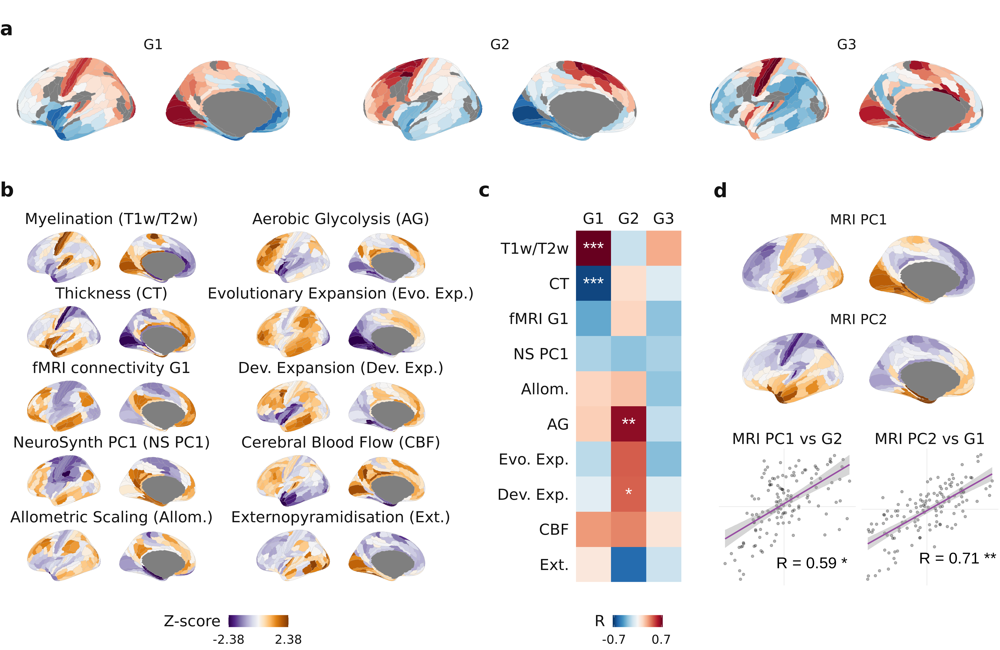

In [64]:
%%R -w 20 -h 13 --units in -r 200 -i hcp_scores -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs
source("../code/plot_maps.R") 

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
# g2 <- atlases_plot
g3 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(4, 'lines'),
            plot.tag.position = c(0, .95))
g4 <- plot_map_corrs(null_p_rename, size=9) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0.1, .95)) & theme(axis.text=element_text(size=22))
g5 <- plot_ahba_mri_brains(pca_scores, colors=brewer.puor(100), ncol=1) + theme(plot.tag.position = c(0,.9))
g6 <- plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs, size=8, ncol=2, x=1, y=-2) + plot_layout(tag_level='new')

layout <- c(
  # Axes
  area(t = 1, b = 9, l = 1, r = 48),    
  # VE etc
  # area(t = 1, b = 20, l = 15, r = 48),
  # All maps
  area(t = 10, b = 38, l = 1, r = 24),
  # All corrs
  area(t = 10, b = 38, l = 25, r = 33),
  # PCA brains
  area(t = 10, b = 25, l = 34, r = 48),
  # AHBA brains
  # area(t = 11, b = 20, l = 30, r = 48),
  # PCA-AHBA scatter
  area(t = 27, b = 38, l = 34, r = 48)

)

plot <- g1 + g3 + g4 + g5 + g6 + plot_layout(design=layout)

(plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=0, b=0, l=0, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

---

# Fig 4

### Brainchart disorder maps

In [66]:
brainchart_maps = get_disorder_maps().loc[:,['ASD','MDD','SCZ']]#.apply(lambda x: x/np.std(x))
# brainchart_maps_plot = brainchart_maps.apply(lambda x: (x-np.mean(x))/np.std(x))

In [67]:
brainchart_maps.describe()

,ASD,MDD,SCZ
count,34.000000,34.000000,34.000000
mean,-0.005206,-0.010912,-0.089471
std,0.018342,0.007597,0.028713
min,-0.039000,-0.027000,-0.139000
25%,-0.014750,-0.015000,-0.107250
50%,-0.006500,-0.011000,-0.091500
75%,0.005500,-0.008000,-0.069750
max,0.038000,0.009000,-0.020000


In [68]:
dk_scores = dm_hcp_3d_ds5.score_in_dk()
# dk_scores = dm_hcp_ds8.score_in_dk()

### Brainchart disorder heatmap

In [69]:
# dk_null_grads = np.load(f"../outputs/permutations/hcp_3d_ds5_spin_5000_in_dk.npy")
dk_null_grads = np.load(f"../outputs/permutations/spin_dk_5000_dm_hcp_3d_ds5_vertices.npy")

In [70]:
corrs = get_corrs(dk_scores, brainchart_maps, method='pearson')
brainchart_null_p = corr_nulls_from_grads(dk_null_grads, dk_scores, brainchart_maps, method='pearsonr')

### Brainchart disorder scatters

In [71]:
brainchart_scatter = (brainchart_maps
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(dk_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G',value_name='G_score')
                .reset_index()
               )

brainchart_scatter_corrs = brainchart_null_p.loc[:,['map','G','r','q']]

In [72]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_dk(dk_scores, facet='w')

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), x=.5, y=-1.5, facet=F)
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=6.5) #+ plot_layout(tag_level='new')


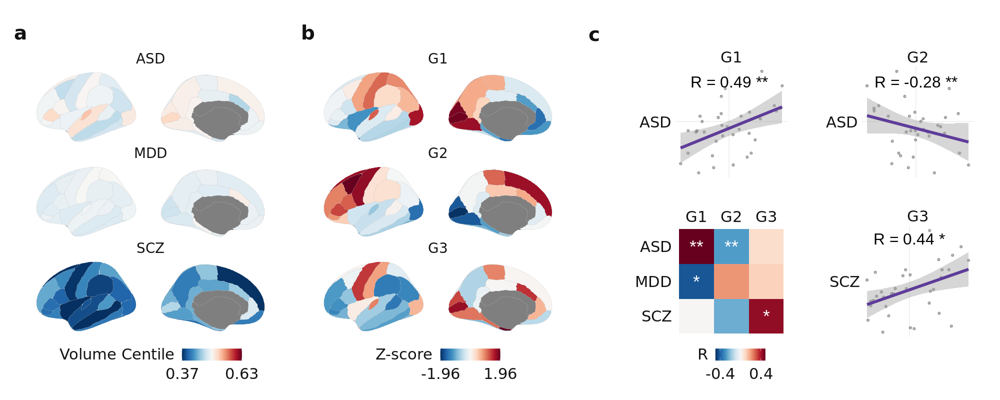

In [104]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1, name='Volume Centile', labels='centile') + theme(plot.tag.position=c(0,.95))
g1b <- plot_maps_dk(dk_scores %>% remove_rownames() %>% column_to_rownames('label'), ncol=1) + theme(plot.tag.position=c(0,.95))

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), 
                         x=0, y=0.03, facet=F, xlab='G1', ylab='ASD') + theme(plot.tag.position=c(0,.88))
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), 
                         x=0, y=0.03, facet=F, xlab='G2', ylab='ASD') + plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), 
                         x=0, y=-0.03, facet=F, xlab='G3', ylab='SCZ') + plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=9) + plot_layout(tag_level='new')

g4 <- plot_spacer()

layout <- c(
    area(t=1,b=48,l=1,r=16),
    area(t=1,b=48,l=17,r=32),    
    
    area(t=1,b=24,l=33,r=40),
    area(t=1,b=24,l=41,r=48),
    area(t=25,b=48,l=41,r=48),
    
    area(t=25,b=48,l=33,r=40)
)

plot <- g1a + g1b + g2a + g2b + g2c + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
# themed

plot1 <- themed + plot_annotation(tag_level='a')
plot1

In [74]:
brainchart_null_p

,G,map,r,p,q
0,G1,ASD,0.489569,0.000200,0.001800
1,G1,MDD,-0.419636,0.010998,0.024745
2,G1,SCZ,0.003580,0.991202,0.991202
3,G2,ASD,-0.276638,0.000600,0.002699
4,G2,MDD,0.217355,0.267347,0.481224
5,G2,SCZ,-0.242215,0.575285,0.778730
6,G3,ASD,0.086508,0.740252,0.832783
7,G3,MDD,0.111714,0.605679,0.778730
8,G3,SCZ,0.435319,0.007798,0.023395


### Mesulam VE Yeo

In [75]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [76]:
mesulam_ve_yeo = (pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
                  .loc[lambda x: x['Mesulam']!=0])
true_means, null_means = compute_region_means(hcp_scores, null_scores, mesulam_ve_yeo['Mesulam'], method='mean')
mesulam_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
mesulam_colors = (mesulam_ve_yeo.loc[:,['Mesulam', 'Mesulam_names', 'Mesulam_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
mesulam_scores_sig = mesulam_scores_sig.join(mesulam_colors.set_index('label'), on='label')

In [77]:
mesulam_scores_sig

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,name,color
0,4,G1,0.9964,1.137116,0.187509,0.412181,2.303857,True,0.0072,0.021600,True,Idiotypic,#80B1D3
1,4,G2,0.7166,0.246806,-0.039885,0.421888,0.679542,True,0.5668,0.826080,False,Idiotypic,#80B1D3
2,4,G3,1.0000,1.291630,0.176610,0.340500,3.274659,True,0.0000,0.000000,True,Idiotypic,#80B1D3
3,3,G1,0.5020,0.221314,0.203251,0.268862,0.067182,True,0.9960,0.996000,False,Unimodal,#FB8072
4,3,G2,0.4794,-0.064421,-0.039556,0.263821,-0.094247,False,0.9588,0.996000,False,Unimodal,#FB8072
5,3,G3,0.0120,-0.257850,0.170219,0.217599,-1.967231,False,0.0240,0.057600,False,Unimodal,#FB8072
6,1,G1,0.0000,-1.188155,0.200265,0.548535,-2.531143,False,0.0000,0.000000,True,Paralimbic,#FFFFB3
7,1,G2,0.3298,-0.431048,-0.064325,0.593449,-0.617952,False,0.6596,0.826080,False,Paralimbic,#FFFFB3
8,1,G3,0.8678,0.584740,0.167781,0.353354,1.180003,True,0.2644,0.453257,False,Paralimbic,#FFFFB3
9,2,G1,0.3442,0.111160,0.203365,0.198798,-0.463814,False,0.6884,0.826080,False,Heteromodal,#BEBADA


### SCZ supragranular

In [78]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()

In [79]:
import nibabel as nib
from neuromaps.nulls.spins import parcels_to_vertices, vertices_to_parcels
scz_diff_img = nib.load('../data/lh.GyralSulcalDifferences.mgh')
hcp_img = annot_to_gifti('../data/parcellations/lh.HCPMMP1.annot')
scz_diff_hcp = vertices_to_parcels(scz_diff_img.get_fdata(), hcp_img)

In [80]:
scz_diff = get_labels_hcp()[:180].to_frame().assign(SCZ_supragranular = scz_diff_hcp).set_index('label')
scz_diff_scatter = scz_diff \
    .join(hcp_scores.set_index('label')).reset_index() \
    .melt(id_vars=['label','SCZ_supragranular'], var_name='G', value_name='G_score') \
    .rename({'SCZ_supragranular':'map_score'}, axis=1).assign(map='SCZ_supragranular')

In [81]:
nulls = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')
null_corrs = corr_nulls_from_grads(nulls, hcp_scores, scz_diff)
scz_diff_corrs = null_corrs.reset_index().rename({'level_0':'G', 'level_1':'map'}, axis=1)

In [116]:
scz_diff_corrs

,index,G,map,r,p,q
0,0,G1,SCZ_supragranular,-0.130714,0.765847,0.765847
1,1,G2,SCZ_supragranular,0.148557,0.757848,0.765847
2,2,G3,SCZ_supragranular,0.552175,0.001400,0.004199


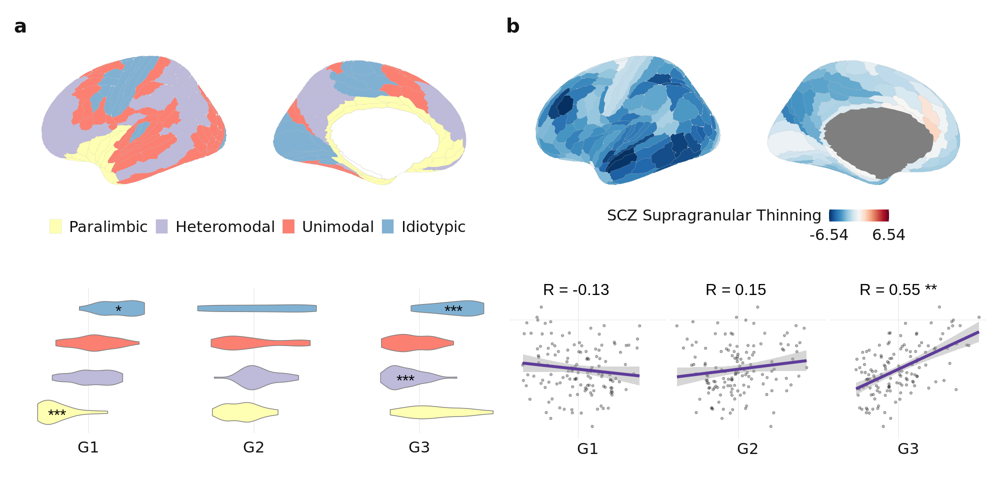

In [107]:
%%R -w 20 -h 10 --units in -r 100 -i mesulam_scores_sig -i mesulam_ve_yeo -i scz_diff -i scz_diff_scatter -i scz_diff_corrs
source("../code/Rplots.R")
source("../code/plot_maps.R")

g1 = plot_hcp_classes(mesulam_ve_yeo, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4)
# g1b = plot_atlas_score_dots(mesulam_scores_sig %>% mutate(atlas='Mesulam'), size=9) + plot_layout(tag_level = 'new')
g1b = plot_atlas_violins(mesulam_ve_yeo) + plot_layout(tag_level='new') +
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

g2 = plot_maps(scz_diff, name='SCZ Supragranular Thinning') + theme(strip.text.x=element_blank())
g2b = plot_maps_scatter(scz_diff_scatter, scz_diff_corrs, y=2) + 
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'), 
          strip.text.y.left=element_blank()) +
    plot_layout(tag_level='new')

layout <- c(
    area(t=1,b=12,l=1,r=24),
    area(t=13,b=24,l=1,r=24),
    area(t=1,b=12,l=25,r=48),
    area(t=13,b=24,l=25,r=48)
)

plot <- g1 + g1b + g2 + g2b + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot2 <- themed + plot_annotation(tag_level='a')
plot2

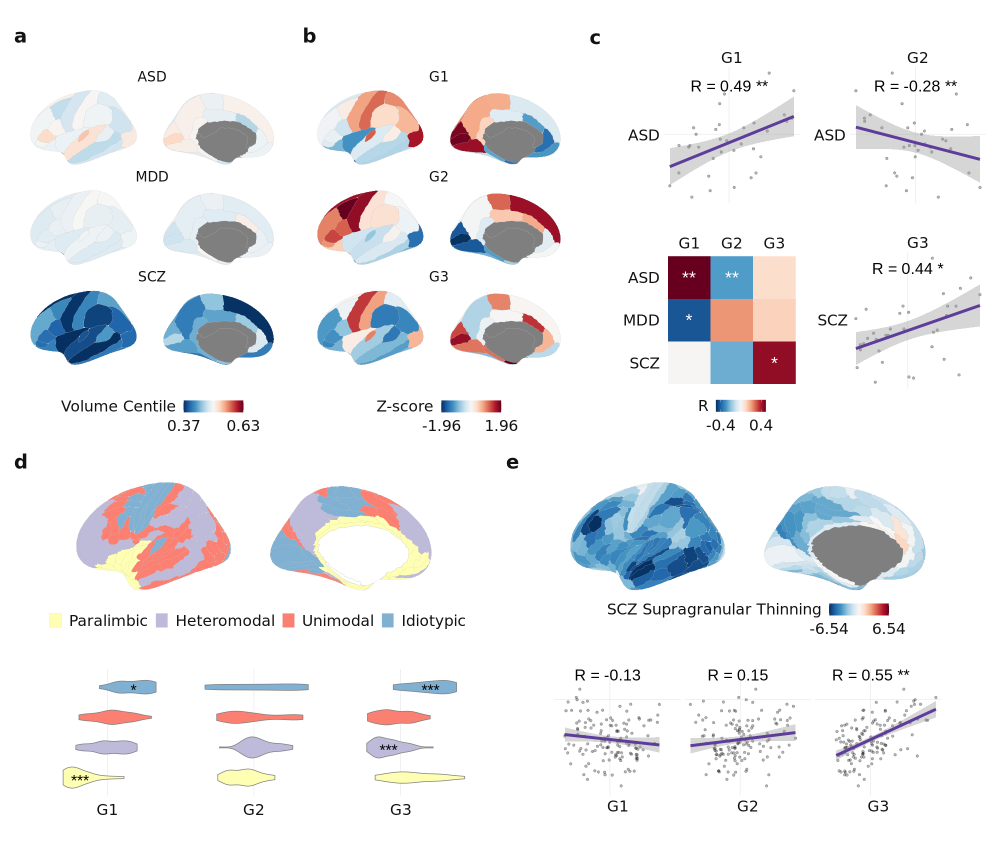

In [112]:
%%R -w 20 -h 17 --units in -r 100
themed <- ((plot1 / plot2) + plot_layout(heights=c(5,5))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

---

# Supplement

### Donor distribution

In [47]:
counts_hcp = pd.read_csv("../outputs/counts_hcp.csv", index_col=0)
# stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
donor_counts = (counts_hcp!=0).sum(axis=1)[:180].rename('count').to_frame().join(get_labels_hcp()).set_index('label')

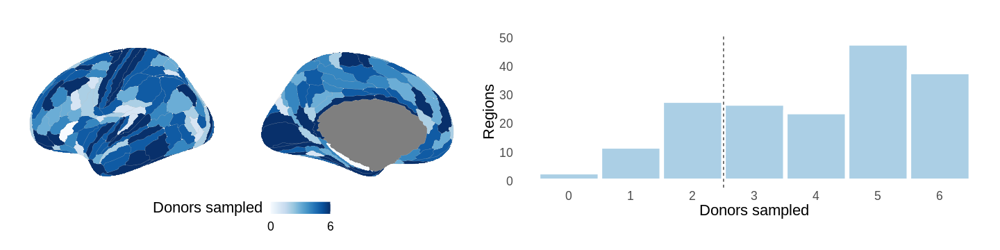

In [120]:
%%R -i donor_counts -w 20 -h 5 --units in
g1 = plot_maps(donor_counts, 
    colorscale='absolute', colors=brewer.blues(100), name='Donors sampled') + 
    theme(strip.text.x=element_blank(), legend.margin=margin(-30), legend.title=element_text(vjust=1))
g2 = plot_dist_donors_hcp(donor_counts)

(g1 | g2) & theme(text=element_text(size=22))

### Parameter choices

In [281]:
# Define variations of processing parameters to test
variations = {
    'gene_stability_threshold': [0.9, 0.8, 0.5],
    'donors_threshold': [3,2,1],
    'lr_mirror': [None],
    'ibf_threshold': [0.2, 0.8],
    'tolerance': [0,4],
    'probe_selection': ['max_intensity', 'rnaseq'],
    'sim_threshold': [2],
    'agg_metric': ['median'],
    'sample_norm': [None, 'zscore'],
    'gene_norm': [None, 'zscore'],
}
defaults = {
    'gene_stability_threshold': 0.8,
    'donors_threshold': 3,
    'lr_mirror': 'rightleft',
    'ibf_threshold': 0.5,
    'tolerance': 2,
    'probe_selection': 'diff_stability',
    'sim_threshold': None,
    'agg_metric': 'mean',
    'sample_norm': 'srs',
    'gene_norm': 'srs'
}

# Re-process with default values (just to be sure)
# base = get_expression_abagen(fetch_hcp(), **defaults)

robustness_data = {}
# # For each parameter, insert the default data as base
# for parameter, default_value in defaults.items():
#     robustness_data[parameter] = {}
#     robustness_data[parameter][default_value] = base

# Process data with one parameter varied, and save
for parameter, values in variations.items():
    print(f'--- Processing values of {parameter} ---')
    out[parameter] = {}
    for v in values:
        # Reset kwargs to default values
        kwargs = defaults
        # Update one value
        kwargs[parameter]=v
        exp = get_expression_abagen(fetch_hcp(), **kwargs)
        robustness_data[parameter][v] = exp
        print(f'Done {parameter}={v}')

# get_expression_abagen(fetch_hcp(), )

--- Processing values of lr_mirror ---
Done lr_mirror=None
--- Processing values of ibf_threshold ---
Done ibf_threshold=0.2
Done ibf_threshold=0.8


In [369]:
base_model = gradientVersion(approach='pca').fit(base)
robustness_corrs = {}
for parameter, values in robustness_data.items():
    robustness_corrs[parameter] = {}
    for value, data in values.items():
        name = f'{parameter}:{value}'
        model = gradientVersion(approach='pca').fit(data, name=name)
        corrs = model.corr_scores(base_model, match=True)['corr']
        robustness_corrs[parameter][value] = np.abs(corrs)

New gradients version: method=pca, kernel=None, sparsity=0, data=
New gradients version: method=pca, kernel=None, sparsity=0, data=lr_mirror:rightleft
New gradients version: method=pca, kernel=None, sparsity=0, data=lr_mirror:None
New gradients version: method=pca, kernel=None, sparsity=0, data=ibf_threshold:0.5
New gradients version: method=pca, kernel=None, sparsity=0, data=ibf_threshold:0.2
New gradients version: method=pca, kernel=None, sparsity=0, data=ibf_threshold:0.8


In [372]:
robustness = {}
for parameter, values in robustness_corrs.items():
    robustness[parameter] = pd.concat(values)
robustness = (pd.concat(robustness)
              .reset_index()
              .set_axis(['parameter', 'value', 'G', 'corr'], axis=1)
              .assign(value = lambda x: x['value'].astype('str'))
              .loc[lambda x: x['G']<3]
)
# robustness

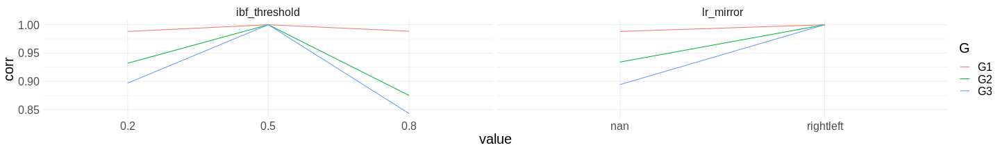

In [378]:
%%R -w 20 -h 3 --units in -i robustness
robustness %>%
mutate(G = factor(G, levels=c(0,1,2), labels=c('G1','G2','G3'))) %>%
arrange(value) %>%
ggplot() + 
facet_wrap(~parameter, scales='free_x') + #, scales='free_x', switch='x') + 
geom_path(aes(x=value, y=corr, color=G, group=G)) +
theme_minimal() +
theme(text=element_text(size=20),
      strip.placement='outside'
)

### Raster plot of filtering options

In [137]:
triplets_pca = triplets_dict['PCA, all regions']
triplets_pca_3d = triplets_dict['PCA, only 3+ donor regions']
triplets_dm_3d = triplets_dict['DME, only 3+ donor regions']
triplets_dm = triplets_dict['DME, all regions']
triplets_pca_2d
triplets_dm_2d

,how,version,component,pair,corr,corr_abs
0,Region scores,0.0,1,012-345,0.885734,0.885734
1,Region scores,0.0,2,012-345,-0.020699,0.020699
2,Region scores,0.0,3,012-345,0.199682,0.199682
3,Region scores,0.0,4,012-345,-0.444058,0.444058
4,Region scores,0.0,5,012-345,0.030135,0.030135
...,...,...,...,...,...,...
495,Region scores,0.9,1,045-123,0.951041,0.951041
496,Region scores,0.9,2,045-123,0.894526,0.894526
497,Region scores,0.9,3,045-123,0.897265,0.897265
498,Region scores,0.9,4,045-123,-0.814028,0.814028


In [164]:
triplets_pca_by_donors = pd.concat({
    '1': triplets_pca,
    '2': triplets_pca_2d,
    '3': triplets_pca_3d,
})
triplets_dm_by_donors = pd.concat({
    '1': triplets_dm,
    '2': triplets_dm_2d,
    '3': triplets_dm_3d,
})

triplets_raster = (pd.concat({
    'pca': triplets_pca_by_donors, 
    'dm': triplets_dm_by_donors
}).reset_index([0,1])
.rename({
    'level_0':'method', 
    'level_1':'donors_filter',
    'version':'gene_filter'
}, axis=1)
.groupby(['component', 'method', 'donors_filter', 'gene_filter'])
.median()
.reset_index()
)

triplets_raster

,component,method,donors_filter,gene_filter,corr,corr_abs
0,1,dm,1,0.0,0.765398,0.779795
1,1,dm,1,0.1,0.782201,0.797478
2,1,dm,1,0.2,0.804568,0.820583
3,1,dm,1,0.3,0.825792,0.838769
4,1,dm,1,0.4,0.845140,0.853084
...,...,...,...,...,...,...
295,5,pca,3,0.5,0.124265,0.268531
296,5,pca,3,0.6,-0.149854,0.247937
297,5,pca,3,0.7,0.106973,0.131774
298,5,pca,3,0.8,0.039301,0.182743


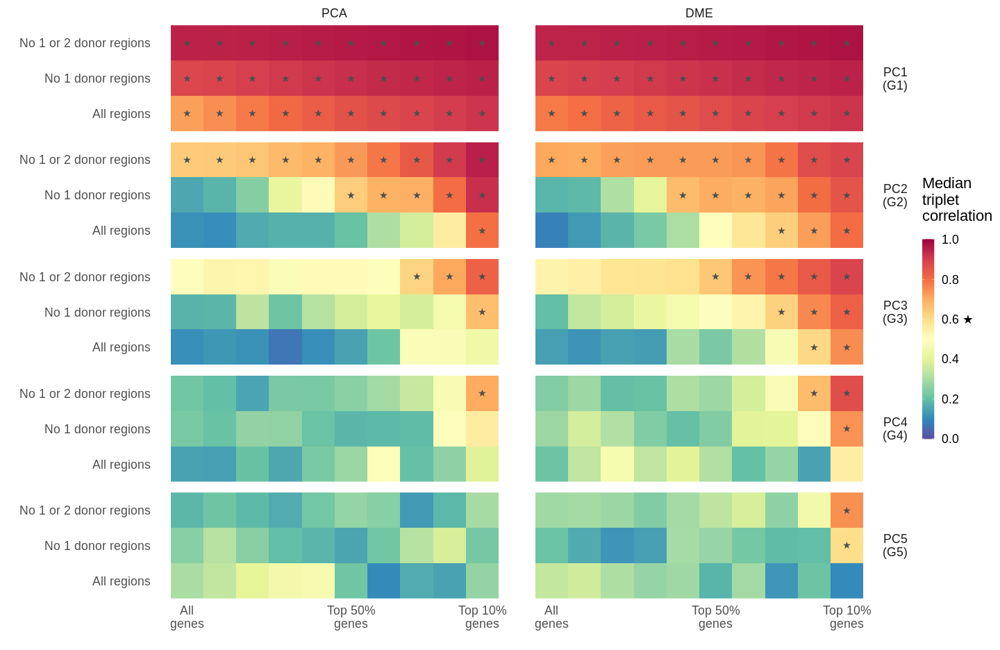

In [250]:
%%R -w 20 -h 13 --units in -i triplets_raster

triplets_raster <- triplets_raster %>% 
mutate(method=factor(method, ordered=T, levels=c('pca','dm'),
        labels=c('PCA', 'DME'))) %>%
mutate(component=factor(component, ordered=T, levels=seq(1,5),
        labels=c('PC1\n(G1)','PC2\n(G2)','PC3\n(G3)','PC4\n(G4)','PC5\n(G5)')))

data_label <- triplets_raster %>%
        mutate(label=case_when(corr_abs > 0.6 ~ '★',
                               TRUE ~ ''
        ))

triplets_raster %>%
ggplot(aes(x=gene_filter, y=donors_filter, fill=corr_abs)) + 
geom_raster() +
geom_text(aes(label=label), data=data_label, color='gray30', size=5) +
# geom_tile(aes(x=gene_filter, y=donors_filter), fill=NA, color='white', size=1,
#             data=triplets_raster %>% filter(corr_abs > 0.6)
# ) +
facet_grid(component~method) +
scale_fill_gradientn(
        colors=rev(brewer.spectral(100)),
        limits=c(0,1), breaks=seq(0,1,.2), 
        labels=c('0.0', '0.2', '0.4', '0.6 ★', '0.8', '1.0'),
        name='Median\ntriplet\ncorrelation'
) +
scale_x_continuous(
        breaks=c(0,.5,.9), minor_breaks=c(.3,.7),
        labels=c('All\ngenes','Top 50%\ngenes','Top 10%\ngenes'),
        name=''
) +
scale_y_discrete(
        labels=c('All regions','No 1 donor regions','No 1 or 2 donor regions'),
        name=''
) +
guides(fill=guide_colorbar(barheight=20)) +
theme_minimal() +
theme(text=element_text(size=22),
      panel.grid=element_blank(),
      legend.title=element_text(vjust=3),
      strip.text.y=element_text(angle=0)
)

### Parcellation

In [103]:
get_expression_abagen(fetch_schaefer(size=400), gene_stability_threshold=0.8, donors_threshold=3, save_name='s400_3d_ds8')

3190 genes remain               after filtering for top 0.2 stability


gene_symbol,A1BG,ABCA5,ABCA6,ABCA9,ABCC1,ABCC12,ABCC5,ABCC8,ABCG4,ABCG5,...,ZNRF1,ZPR1,ZRANB3,ZSCAN18,ZSCAN29,ZSCAN31,ZSCAN9,ZSWIM4,ZSWIM9,ZYX
label,,,,,,,,,,,,,,,,,,,,,
2,0.472923,0.651473,0.684197,0.594284,0.710410,0.301854,0.761277,0.717989,0.657904,0.325333,...,0.419952,0.247809,0.438592,0.278738,0.662845,0.737612,0.766576,0.701562,0.287590,0.703678
3,0.397290,0.669515,0.724267,0.703682,0.638814,0.479500,0.691850,0.788317,0.668816,0.271038,...,0.260748,0.306804,0.245255,0.337981,0.680196,0.642276,0.710855,0.628618,0.346627,0.747868
4,0.190220,0.672394,0.772981,0.697353,0.527150,0.277604,0.619950,0.799564,0.601957,0.358699,...,0.284973,0.201033,0.318488,0.157614,0.602520,0.740595,0.708365,0.667033,0.218185,0.752432
5,0.212551,0.844216,0.708637,0.775653,0.766519,0.344040,0.891723,0.946375,0.770348,0.304406,...,0.160544,0.121756,0.296641,0.108983,0.816772,0.650599,0.785808,0.884327,0.272317,0.917192
6,0.313586,0.538111,0.786537,0.624562,0.630177,0.461860,0.666783,0.770303,0.649714,0.388838,...,0.271560,0.462822,0.439546,0.282701,0.573399,0.699662,0.772648,0.557260,0.244179,0.855575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,0.651811,0.316318,0.370127,0.397953,0.377533,0.575704,0.478123,0.497410,0.360104,0.774631,...,0.561528,0.704154,0.638345,0.779080,0.408547,0.467199,0.448135,0.340963,0.607164,0.399226
177,0.555412,0.421682,0.431763,0.454661,0.465394,0.694844,0.462940,0.550515,0.453558,0.643262,...,0.466504,0.516452,0.608249,0.591627,0.606801,0.548679,0.524255,0.453101,0.545383,0.507499
178,0.611768,0.393004,0.483071,0.336364,0.383209,0.621866,0.388570,0.503050,0.495576,0.615320,...,0.510740,0.566416,0.412140,0.412147,0.572682,0.189884,0.390245,0.561896,0.638712,0.520651


In [106]:
pca_dk_ds8 = gradientVersion(approach='pca', kernel=None).fit('dk_ds8')
pca_dx_3d_ds8 = gradientVersion(approach='pca', kernel=None).fit('dx_3d_ds8')
pca_s400_3d_ds8 = gradientVersion(approach='pca', kernel=None).fit('s400_3d_ds8')

New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=dk_ds8
New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=dx_3d_ds8
New gradients version: method=pca, params={}, kernel=None, sparsity=0, data=s400_3d_ds8


In [110]:
hcp_scores = pca_hcp_3d_ds8.clean_scores().assign(version='HCP-MMP1.0')
dk_scores = pca_dk_ds8.clean_scores().assign(version='Desikan-Killiany')
dx_scores = pca_dx_3d_ds8.clean_scores().assign(version='Desterieux')
s400_scores = (pca_s400_3d_ds8.scores
             .apply(lambda x: (x-np.mean(x))/np.std(x))
             .join(get_labels_schaefer(size=400))
             .assign(version='Schaefer-400')
            )

In [112]:
corrs_dict = {
    'HCP-MMP1.0': correlate(pca_hcp_3d_ds8.fit_weights(overwrite=False), pca_hcp_3d_ds8.weights),
    'Desikan-Killiany': correlate(pca_dk_ds8.fit_weights(), pca_hcp_3d_ds8.weights),
    'Desterieux': correlate(pca_dx_3d_ds8.fit_weights(), pca_hcp_3d_ds8.weights),    
    'Schaefer-400': correlate(pca_s400_3d_ds8.fit_weights(), pca_hcp_3d_ds8.weights)

}

weight_corrs = (pd.concat(corrs_dict)
 .melt(ignore_index=False)
 .reset_index()
 .set_axis(['version','x','y','corr'], axis=1)
 .loc[lambda x: (x['x'] < 3) & (x['y'] < 3)]
 .replace({'x':{0:'G1',1:'G2',2:'G3'}, 'y':{0:'G1',1:'G2',2:'G3'}})
)

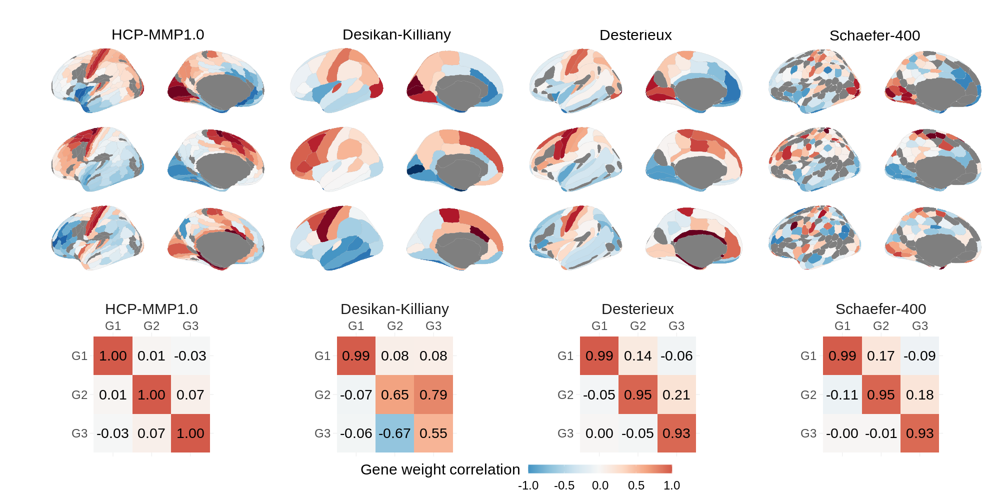

In [119]:
%%R -w 2000 -h 1000 -i hcp_scores -i dk_scores -i dx_scores -i s400_scores -i weight_corrs 
source("../code/Rplots.R")
source("../code/brainPlots.R")

g1a <- plot_hcp(hcp_scores)
g1b <- plot_dk(dk_scores) + plot_layout(tag_level='new')
g1c <- plot_dx(dx_scores) + plot_layout(tag_level='new')
g1d <- plot_schaefer(s400_scores, size=400) + plot_layout(tag_level='new')

g2 <- plot_weight_corrs(weight_corrs, spacing=14, ylab='HCP-MMP1.0')


plot <- (
    ((g1a | g1b | g1c | g1d) & theme(legend.position='none', strip.text.y=element_blank())) /
    g2
) + plot_layout(heights=c(2,1))


themed <- plot & theme(
    text=element_text(size=30),
    legend.title=element_text(vjust=1),
    strip.text.x = element_text(size=30)
)
themed

---

# Other

In [ ]:
weights_version = dm_hcp_3d_ds5
weights = dm_hcp_3d_ds5.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)

## Disorder weight scatters

In [ ]:
gandal_genes = get_gandal_genes()
weights_labels = get_gene_weights_with_labels(weights, gandal_genes).assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))

## Disorder enrichments

In [ ]:
gandal_genes_enrichment_dict = {
    'upreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='pos'),
    'downreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='neg'),
}

In [ ]:
gandal_genes_enrichment = (pd.concat(gandal_genes_enrichment_dict)
                           # .assign(updown = lambda x: x.index.get_level_values(0).astype('str'))
                           .assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))
                           .assign(updown = lambda x: pd.Categorical(x.index.get_level_values(0).astype('str'), 
                                                                     categories=['upreg.','downreg.'], ordered=True))
                           .sort_values(['label','updown'])
                           .assign(label = lambda x: x['label'].astype('str') + ' ' + x['updown'].astype('str'))
                          )

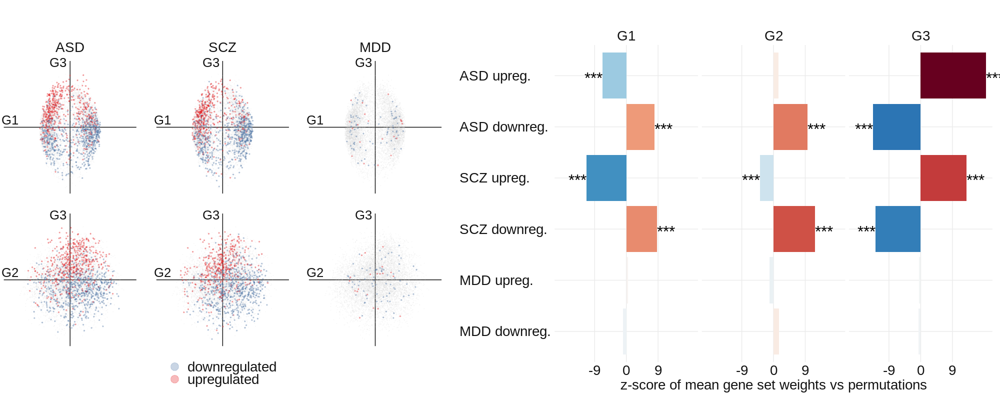

In [ ]:
%%R -i weights_labels -i gandal_genes_enrichment -w 20 -h 8 --units in -r 100
source('../code/enrichmentsPlots.R')
g1 <- plot_weight_scatters_with_labels(weights_labels, colors=rev(brewer.set1(10)[1:2]), drop='G1 v G2') + guides(colour = guide_legend(override.aes = list(size=5)))
g2 <- plot_enrichment_bars_z(gandal_genes_enrichment, xlab='z-score of mean gene set weights vs permutations') + theme(axis.text.y = element_text(hjust=0))
plot1 <- g1 + g2
plot1

---

## Compare with Jake's maps

In [95]:
jake_axes = (pd.read_csv('../data/tx_PLScomps_jake_glasser.csv')
             .set_axis([i+1 for i in range(180)]).join(get_labels_hcp()).set_index('label')
             .apply(lambda x: (x-np.mean(x))/np.std(x))
            )
jake_axes

,TxGrad1,TxGrad2,TxGrad3
label,,,
V1,2.379033,-0.847172,1.729835
MST,0.774669,-1.193433,0.444441
V6,0.613730,-1.369562,1.325712
V2,2.063502,-1.163917,1.681928
V3,1.702069,-1.454998,1.415406
...,...,...,...
STSva,0.613368,-0.252974,-1.729379
TE1m,0.569421,-0.538692,-1.749047
PI,0.805728,0.584211,-1.708206


In [96]:
sim_grads = np.load("../outputs/permutations/hcp_ds8_sim_1000.npy")
# sim_grads = np.load("../outputs/permutations/hcp_3d_ds5_sim_1000.npy")
null_corrs = corr_nulls_from_grads(sim_grads, hcp_scores, jake_axes, method='pearson')
null_p = get_null_p(corrs, null_corrs, adjust=None)

In [114]:
maps_scatter = (jake_axes
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(hcp_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G', value_name='G_score')
                .reset_index()
               )
maps_scatter_corrs = null_p.loc[:,['map','G','true_mean','q']].assign(q=1)

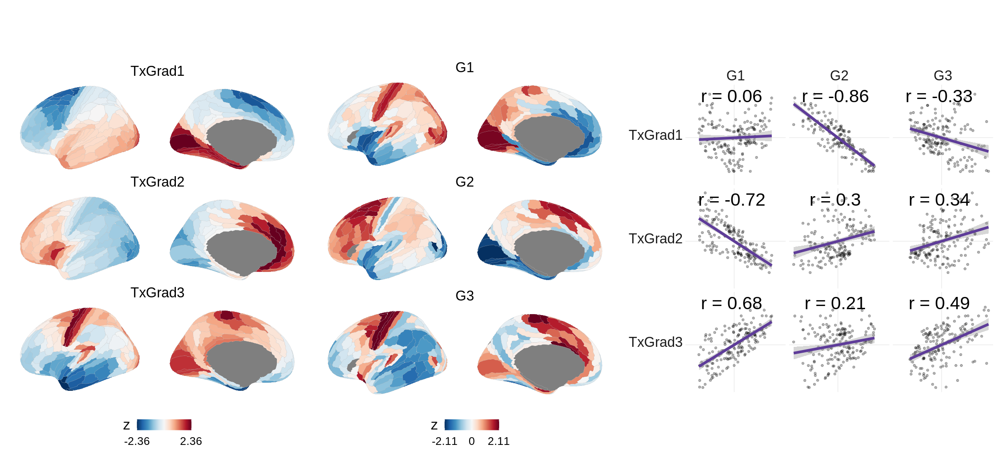

In [119]:
%%R -i hcp_scores -i maps_scatter -i maps_scatter_corrs -i jake_axes -w 22 -h 10 --units in -r 100
source("../code/plot_maps.R")

g1 <- plot_maps(jake_axes, ncol=1, colors=rev(brewer.rdbu(100)), spacing=0) 
g2 <- plot_hcp(hcp_scores, facet='w')
g4 <- plot_maps_scatter(maps_scatter, maps_scatter_corrs, x=0, y=2.5, size=10)

((g1 | g2) | g4) & theme(text=element_text(size=22), strip.text=element_text(size=22))

In [125]:
hcp_scores.corr().round(2)

,G1,G2,G3
G1,1.0,-0.0,0.0
G2,-0.0,1.0,0.0
G3,0.0,0.0,1.0


In [124]:
jake_axes.corr().round(2)

,TxGrad1,TxGrad2,TxGrad3
TxGrad1,1.00,-0.51,-0.29
TxGrad2,-0.51,1.00,-0.22
TxGrad3,-0.29,-0.22,1.00


In [130]:
dm_hcp_ds8.weights.corr().round(2)

,0,1,2,3,4
0,1.00,0.03,-0.02,0.15,0.13
1,0.03,1.00,0.30,0.03,0.21
2,-0.02,0.30,1.00,-0.11,-0.17
3,0.15,0.03,-0.11,1.00,-0.01
4,0.13,0.21,-0.17,-0.01,1.00


In [136]:
dm_hcp_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_diffmap_gene_weights.csv')

## For plotting brains

In [96]:
maps_to_plot = [
    'Myelination (T1w/T2w ratio)',
    'Glycolytic Index (CMRO2/CMRGlu)',
    'Developmental Expansion'
]

hcp_maps = maps.loc[:, maps_to_plot]

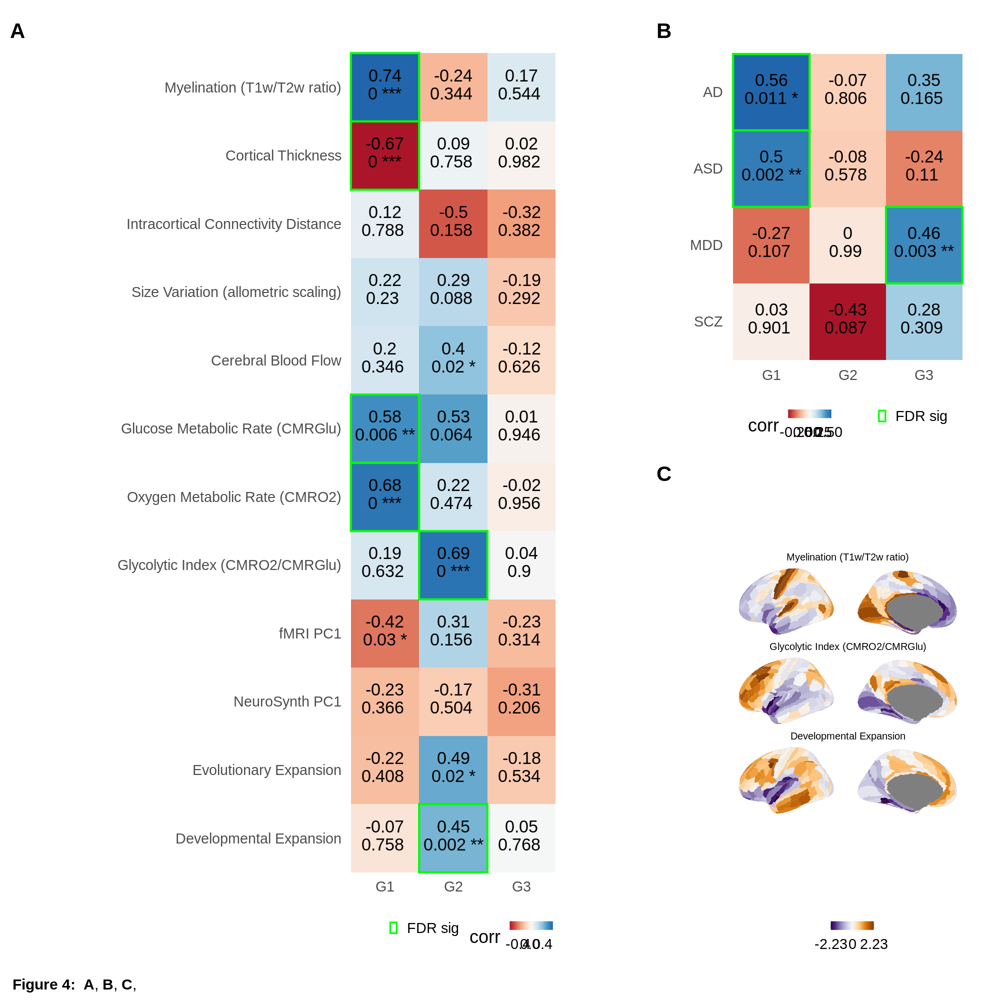

In [191]:
%%R -i mri_corrs -i disorder_corrs -i hcp_maps -w 2000 -h 2000
source("../code/plot_maps.R")
g1 <- plot_corr_versions(mri_corrs, size=12)
g2 <- plot_corr_versions(disorder_corrs, size=12)
g3 <- plot_maps(hcp_maps, ncol=1, colors=rev(brewer.puor(100)))

plot <- (
    g1 | 
    (g2 / g3)
) + plot_layout(widths=c(3,2))

themed <- plot & theme(
    text=element_text(size=36),
    plot.margin = margin(t=10, r=30, b=10, l=10, "pt"),
    plot.tag = element_text(size=42, face='bold', vjust=-2)
)

caption <- paste("**Figure 4:**",
                "**A**, ",
                "**B**, ",
                "**C**, "
)

annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 30, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated